In [2]:
import networkx as nx

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

from sklearn.preprocessing import MinMaxScaler

## Clean Data

### Export Data

In [3]:
df_export_clean = pd.read_excel('trade_data/PH_exports_11to20.xlsx')

In [4]:
df_export_clean.iloc[6:,1:]

df_export = df_export_clean.iloc[6:,1:]

_ = ['country']
_.extend(list(range(2011,2021)))
# _

df_export.columns = _
df_export.columns = df_export.columns.astype(str)
df_export

,country,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
6,"Afghanistan, Islamic Rep. of",3.537464,2.442541,3.441023,7.493161,6.348643,7.370376,3.521958,6.429697,7.692014,4.123165
7,Albania,0.290238,0.165656,0.065508,0.265332,0.117464,0.009264,0.022694,0.013670,0.245820,0.026088
8,Algeria,2.291268,2.615905,4.060260,4.561517,6.409446,2.432461,2.759824,3.099249,2.631116,0.974235
9,American Samoa,0.795049,0.677007,0.879695,0.728841,2.669582,2.570536,0.083801,1.182309,1.356501,1.068861
10,Angola,0.674858,0.592139,0.671486,0.813902,0.380336,0.361640,0.326373,0.361009,0.391576,0.360136
...,...,...,...,...,...,...,...,...,...,...,...
208,"Venezuela, Rep. Bolivariana de",5.823040,7.951426,4.034769,4.770471,3.173804,1.471797,0.596537,0.667559,0.380481,0.579420
209,Vietnam,718.004176,593.443265,523.932589,374.741386,727.041250,746.516792,867.170485,943.780723,1269.635637,1262.820820
210,"Yemen, Rep. of",6.673345,6.347279,7.963391,4.335741,2.874305,2.211548,0.738735,1.792850,5.073761,4.270021
211,Zambia,0.313116,0.092774,0.179978,0.108544,0.016001,0.572017,0.127532,0.118699,0.299029,0.296564


In [5]:
def isolate_year(df, year, thresh=None):
    '''arranges df according to specified year'''
    # NaN values dropped
    out = (df
           # .dropna(subset=[year])
           .fillna(0)
           .sort_values(by=year, ascending=False)
          )
    if thresh is not None:
        out = df[df[year] > thresh]
    return out

# arrange 
exp_PH_21 = isolate_year(df_export, '2020')

In [6]:
def cnt_thresh(df, year, thresh):
    total_val = df[year].sum()
    not_partner = len(df[df[year] == 0])
    cnt_low = len(df[(df[year] < thresh) & (df[year] > 0)])
    cnt_high = len(df[df[year] >= thresh])
    
    lst_countries = df[df[year] >= thresh]['country']
    
    print(f'Total Export Value (FOB): {total_val} in Mio USD')
    print(f'There are {not_partner} countries that are not trading partners.')
    print(f'There are {cnt_low} countries that fall below the threshold. ({(cnt_low/(cnt_low+cnt_high)*100):.4f}% of all trading partners)')
    print(f'There are {cnt_high} countries that fall above the threshold. ({(cnt_high/(cnt_low+cnt_high)*100):.4f}% of all trading partners)\n')
    print(f'List of countries above threshold: {list(lst_countries)}')
    
cnt_thresh(exp_PH_21, '2020', 1000)

Total Export Value (FOB): 63531.78201600001 in Mio USD
There are 21 countries that are not trading partners.
There are 174 countries that fall below the threshold. (93.5484% of all trading partners)
There are 12 countries that fall above the threshold. (6.4516% of all trading partners)

List of countries above threshold: ['Japan', 'United States', 'China, P.R.: Mainland', 'China, P.R.: Hong Kong', 'Singapore', 'Thailand', 'Korea, Rep. of', 'Germany', 'Taiwan Province of China', 'Netherlands, The', 'Malaysia', 'Vietnam']


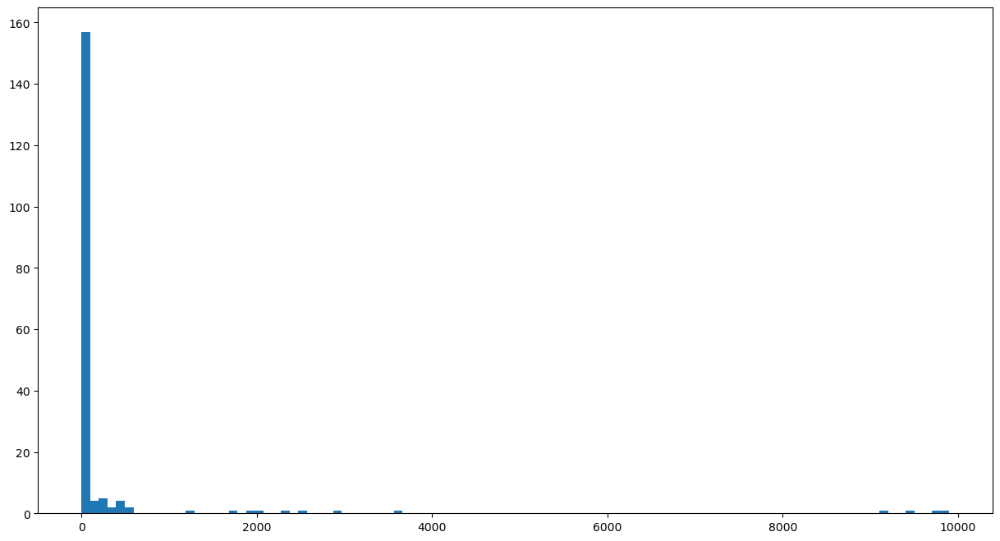

In [7]:
def hist_countries(df, year, thresh, bin_size=100):
    fig, ax = plt.subplots(figsize=[15,8])
    ax.hist(df[df[year] > thresh][year], bins=bin_size )
    plt.show();
    
hist_countries(exp_PH_21, '2020', 0, 100)

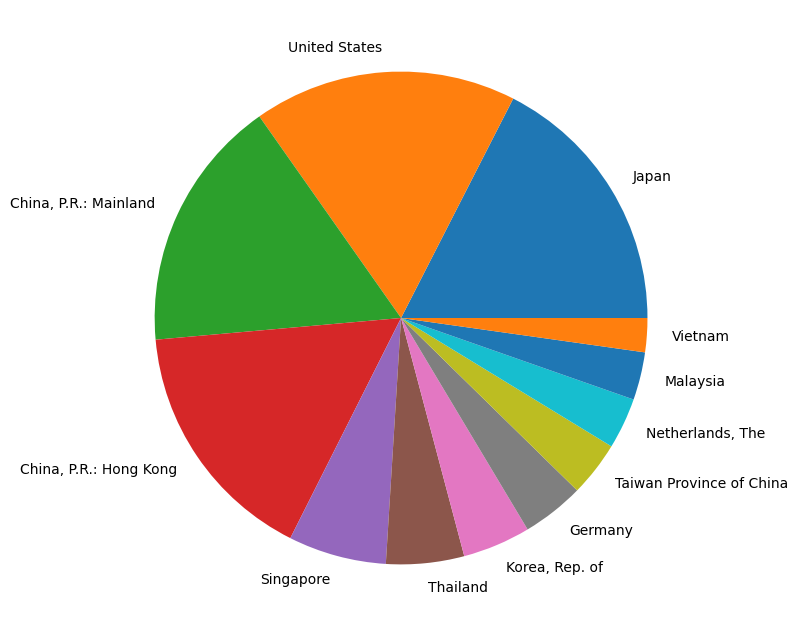

In [8]:
# plot countries

def pie_countries(df, year, thresh):
    labels = df[df[year] > thresh]['country']
    sizes = df[df[year] > thresh][year]

    fig, ax = plt.subplots(figsize=[15,8])
    ax.pie(sizes, labels=labels)
    plt.show();
    
pie_countries(exp_PH_21, '2020', 1000)

### Import Data

In [9]:
df_import_clean = pd.read_excel('trade_data/PH_imports_11to20.xlsx')

In [10]:
# df_import_clean.iloc[6:, 1:]

df_import = df_import_clean.iloc[6:, 1:]

_ = ['country']
_.extend(list(range(2011,2021)))
# _

df_import.columns = _
df_import.columns = df_import.columns.astype(str)
df_import

,country,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
6,"Afghanistan, Islamic Rep. of",0.330447,0.246536,0.346260,0.305607,1.201999,0.059848,0.003186,0.004976,0.091528,0.002406
7,Albania,0.094404,0.018755,NaN,0.014467,0.118220,1.910166,0.684913,1.066665,1.150984,0.257237
8,Algeria,1.276390,0.018054,0.001261,0.044631,0.171297,1.987376,33.903418,16.467880,0.140277,0.246454
9,American Samoa,0.000112,NaN,0.000938,0.000166,0.048784,0.559698,0.000099,6.291665,NaN,0.125619
10,Angola,0.017206,0.128689,0.440668,0.204125,0.894650,0.078948,5.075326,5.519573,1.493144,12.570616
...,...,...,...,...,...,...,...,...,...,...,...
206,"Venezuela, Rep. Bolivariana de",0.535858,0.309373,0.468132,0.126514,0.416875,0.090258,0.094130,0.078545,0.408310,0.716543
207,Vietnam,934.266541,1045.575090,890.528906,1387.609890,1297.430193,1982.274479,2522.366249,3035.127940,3860.033335,3074.809172
208,"Yemen, Rep. of",NaN,0.045488,130.288491,0.620393,0.126197,0.168307,0.005697,0.037005,NaN,NaN
209,Zambia,1.666080,0.301338,0.106527,1.425771,3.866937,1.320553,0.328329,0.149598,NaN,0.002335


In [11]:
imp_PH_20 = isolate_year(df_import, '2020')
imp_PH_20

,country,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
46,"China, P.R.: Mainland",6665.165874,7329.469058,8836.516474,10661.708272,11915.232640,15916.070697,16831.885045,21394.268867,26756.381043,20396.848394
102,Japan,7160.893344,7090.681215,5738.954302,5711.781455,7022.949792,10196.483011,10555.145569,10549.118187,11217.877058,8589.499466
202,United States,7155.833014,7833.195925,7357.542580,6198.526945,7940.391748,7680.898544,7417.927020,7820.192830,8555.656890,6940.875439
108,"Korea, Rep. of",4831.605653,4954.512626,5279.803446,5547.045221,4770.560118,5622.545456,8073.297967,11162.332875,8759.567823,6885.377694
95,Indonesia,2609.637013,3005.552129,2980.168184,3299.926524,3221.753558,4707.531762,6305.490183,6399.757583,7299.281417,5880.055917
...,...,...,...,...,...,...,...,...,...,...,...
138,Namibia,0.000000,0.000000,0.434060,0.024414,0.001855,0.000000,0.000000,0.000000,0.000000,0.000000
31,Botswana,0.001110,0.000000,0.000000,0.002967,0.000019,0.000885,0.001419,0.000818,0.000000,0.000000
133,Montenegro,0.000000,9.234917,11.651065,0.000000,7.539891,0.000000,0.000000,0.000000,0.000000,0.000000
28,Bhutan,0.005260,0.000928,0.000000,0.000000,0.000504,0.000000,0.000000,0.000000,0.000000,0.000000


In [12]:
cnt_thresh(imp_PH_20, '2020', 0)

Total Export Value (FOB): 89812.170298 in Mio USD
There are 32 countries that are not trading partners.
There are 0 countries that fall below the threshold. (0.0000% of all trading partners)
There are 205 countries that fall above the threshold. (100.0000% of all trading partners)

List of countries above threshold: ['China, P.R.: Mainland', 'Japan', 'United States', 'Korea, Rep. of', 'Indonesia', 'Singapore', 'Thailand', 'Taiwan Province of China', 'Malaysia', 'Vietnam', 'China, P.R.: Hong Kong', 'Germany', 'India', 'Russian Federation', 'Australia', 'Brazil', 'France', 'Italy', 'Saudi Arabia', 'Netherlands, The', 'United Kingdom', 'Canada', 'New Zealand', 'United Arab Emirates', 'Belgium', 'Spain', 'Kuwait', 'Switzerland', 'Argentina', 'Israel', 'Qatar', 'Ireland', 'Sweden', 'Bulgaria', 'Brunei Darussalam', 'Finland', 'Mexico', 'Denmark', 'Austria', 'Ukraine', 'Papua New Guinea', 'Poland, Rep. of', 'Nigeria', 'Romania', 'Myanmar', 'Pakistan', 'Türkiye, Rep of', 'Czech Rep.', 'Malta',

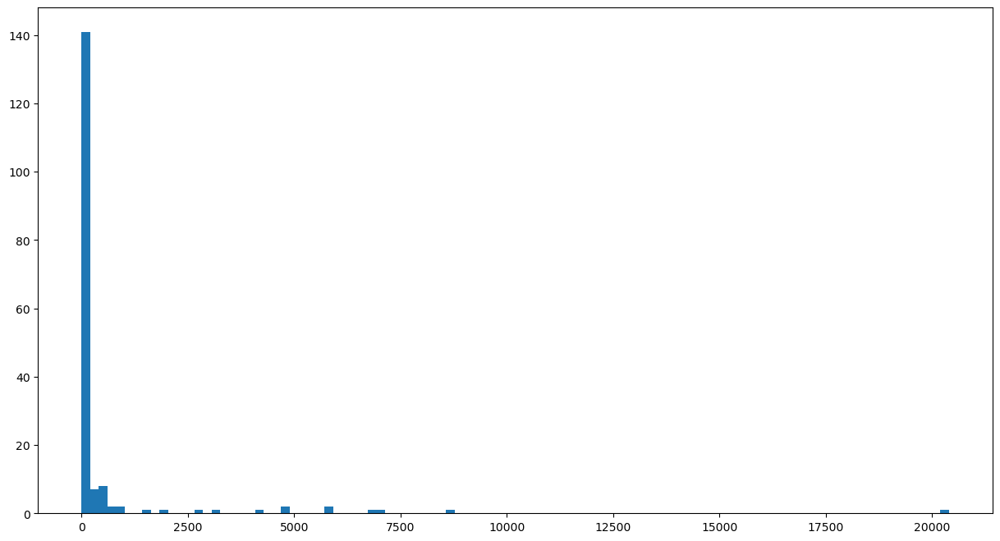

In [13]:
hist_countries(imp_PH_20, '2020', 0, 100)

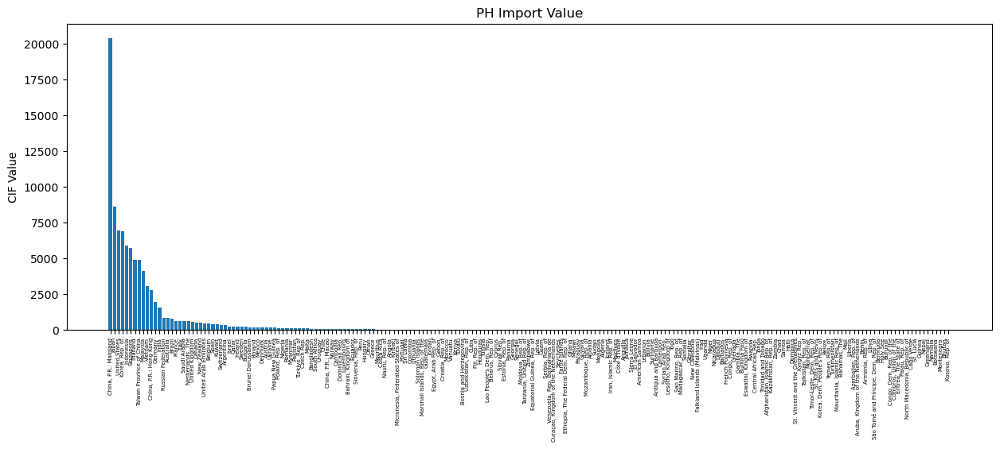

In [14]:
# FOR MEDIUM
# hist_countries(imp_PH_20, '2020', 0, 205)

df__ = imp_PH_20
fig, ax = plt.subplots(figsize=[15,5])
ax.bar(x=df__['country'], height=df__['2020'])
ax.tick_params(axis='x', labelsize=5)
# plt.xlabel('Countries')
plt.ylabel('CIF Value')
plt.title('PH Import Value')
plt.xticks(rotation='vertical')
plt.show();

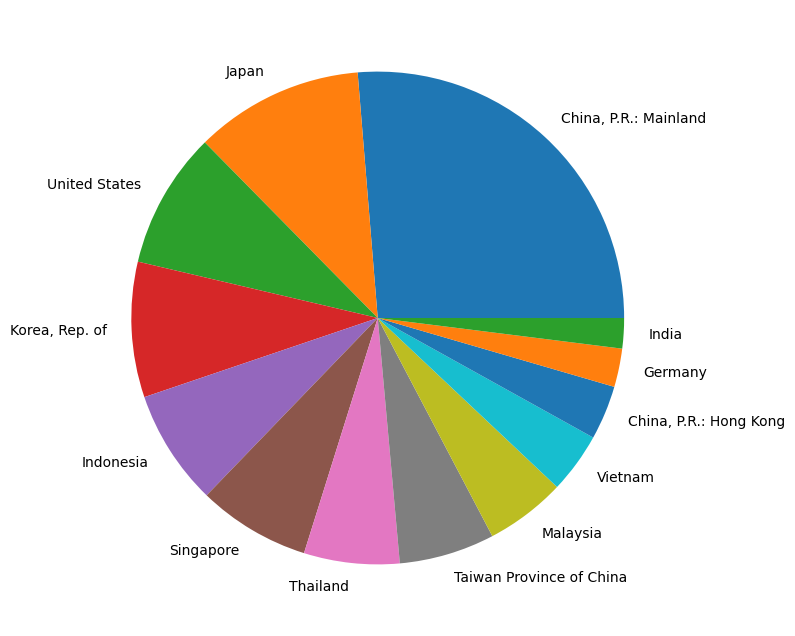

In [15]:
pie_countries(imp_PH_20, '2020', 1000)

### Store Trading Partners

In [16]:
# template for cleaning

us_imports = pd.read_excel('trade_data/us_imports.xlsx')
# us_imports

us_imports = us_imports.iloc[6:, 1:]

_ = ['country']
_.extend(list(range(2011,2021)))

us_imports.columns = _
us_imports.columns = us_imports.columns.astype(str)
us_imports

,country,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
6,"Afghanistan, Islamic Rep. of",26.139389,36.765072,45.514058,72.015255,21.561884,33.519088,14.481991,28.915075,36.302628,16.954830
7,Albania,26.413904,18.856919,22.776586,68.968810,160.003661,124.694903,41.604158,68.025429,56.506700,46.719628
8,Algeria,14609.285365,9993.334569,4830.871545,4628.887168,3371.546348,3228.781737,3808.000132,4618.350007,2479.563664,478.428586
9,Angola,13597.473429,9823.874266,8742.942417,5719.807202,2807.574490,2856.481491,2603.566843,2698.363854,954.541199,471.736080
10,Anguilla,NaN,NaN,NaN,NaN,NaN,0.710049,3.276235,5.103774,2.358182,1.580259
...,...,...,...,...,...,...,...,...,...,...,...
207,Vietnam,17487.840228,20267.676965,24654.039935,30588.511328,37993.049481,42109.161042,46483.469013,49212.052669,66680.322034,79645.033286
208,West Bank and Gaza,7.752237,5.095927,5.304512,4.561317,5.569837,6.390112,5.247480,3.289538,4.082784,5.204983
209,"Yemen, Rep. of",561.709854,87.107413,65.593850,41.200651,48.314414,2.396259,9.542905,2.164858,4.680298,3.910856
210,Zambia,47.321448,63.020002,37.700326,55.626424,47.091141,46.578757,66.050933,182.738460,83.027689,40.303535


In [17]:
#get only trading partners
def dropna_year(df, year, thresh=None):
    '''arranges df according to specified year'''
    # NaN values dropped
    out = (df
           .dropna(subset=[year])
           # .fillna(0)
           .sort_values(by=year, ascending=False)
          )
    if thresh is not None:
        out = df[df[year] > thresh]
    return out

us_imports = dropna_year(us_imports, '2020')

us_imports['source'] = 'United States'
us_imports[['source','country','2020']]

,source,country,2020
45,United States,"China, P.R.: Mainland",435449.022854
127,United States,Mexico,325394.308794
39,United States,Canada,270381.782336
101,United States,Japan,119511.957179
78,United States,Germany,115120.055415
...,...,...,...
149,United States,"Palau, Rep. of",0.458132
27,United States,Bhutan,0.424707
65,United States,"Eritrea, The State of",0.272810
176,United States,"South Sudan, Rep. of",0.104602


In [18]:
cols = ['country','target','2020']
trade_nw_df_impt = pd.DataFrame(columns=cols)

file_names = ['ch',
              'germ',
              'hk',
              'india',
              'indo',
              'jpn',
              'kor',
              'mysia',
              'nether',
              'sg',
              'thai',
              'us',
              'viet']

country_list = ['China, P.R.: Mainland',
                'Germany',
                'China, P.R.: Hong Kong',
                'India',
                'Indonesia',
                'Japan',
                'Korea, Rep. of',
                'Malaysia',
                'Netherlands, The',
                'Singapore',
                'Thailand',
                'United States',
                'Vietnam']

for file, name in zip(file_names, country_list):
    path = 'trade_data/' + file + '_imports.xlsx'
    df_ = pd.read_excel(path)
    df_ = df_.iloc[6:, 1:]
    
    #fill cols
    _ = ['country']
    _.extend(list(range(2011,2021)))
    df_.columns = _
    df_.columns = df_.columns.astype(str)
    
    # remove nans
    df_ = dropna_year(df_, '2020')
    
    # new col with source, and extract the three columns
    df_['target'] = name
    df_ = df_[['country','target','2020']]
    
    # concat to final df
    trade_nw_df_impt = pd.concat([trade_nw_df_impt,df_]).reset_index(drop=True)
    
#add the PH paths
ph_imp = isolate_year(df_import, '2020', 1000)
ph_imp['target'] = 'Philippines'
ph_imp = ph_imp[['country','target','2020']]
trade_nw_df_impt = pd.concat([trade_nw_df_impt,ph_imp]).reset_index(drop=True)

/tmp/ipykernel_127/2095601380.py:55: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ph_imp['target'] = 'Philippines'


In [19]:
# this is our network df for EXPORTS
trade_nw_df_impt

,country,target,2020
0,Taiwan Province of China,"China, P.R.: Mainland",202054.800490
1,Japan,"China, P.R.: Mainland",176089.030580
2,"Korea, Rep. of","China, P.R.: Mainland",173501.485950
3,United States,"China, P.R.: Mainland",136122.546760
4,Australia,"China, P.R.: Mainland",114766.773580
...,...,...,...
2471,Singapore,Philippines,5721.898120
2472,Taiwan Province of China,Philippines,4859.727342
2473,Thailand,Philippines,4861.109808
2474,United States,Philippines,6940.875439


In [20]:
cols = ['source','country','2020']
trade_nw_df_exp = pd.DataFrame(columns=cols)

file_names = ['ch',
              'germ',
              'hk',
              'india',
              'indo',
              'jpn',
              'kor',
              'mysia',
              'nether',
              'sg',
              'thai',
              'us',
              'viet']

country_list = ['China, P.R.: Mainland',
                'Germany',
                'China, P.R.: Hong Kong',
                'India',
                'Indonesia',
                'Japan',
                'Korea, Rep. of',
                'Malaysia',
                'Netherlands, The',
                'Singapore',
                'Thailand',
                'United States',
                'Vietnam']

for file, name in zip(file_names, country_list):
    path = 'trade_data/' + file + '_exports.xlsx'
    df_ = pd.read_excel(path)
    df_ = df_.iloc[6:, 1:]
    
    #fill cols
    _ = ['country']
    _.extend(list(range(2011,2021)))
    df_.columns = _
    df_.columns = df_.columns.astype(str)
    
    # remove nans
    df_ = dropna_year(df_, '2020')
    
    # new col with source, and extract the three columns
    df_['source'] = name
    df_ = df_[['source','country','2020']]
    
    # concat to final df
    trade_nw_df_exp = pd.concat([trade_nw_df_exp,df_]).reset_index(drop=True)
    
#add the PH paths
ph_exp = isolate_year(df_export, '2020', 1000)
ph_exp['source'] = 'Philippines'
ph_exp = ph_exp[['source','country','2020']]
trade_nw_df_exp = pd.concat([trade_nw_df_exp,ph_exp]).reset_index(drop=True)

/tmp/ipykernel_127/3961240171.py:55: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ph_exp['source'] = 'Philippines'


In [21]:
trade_nw_df_exp

,source,country,2020
0,"China, P.R.: Mainland",United States,452832.222870
1,"China, P.R.: Mainland","China, P.R.: Hong Kong",275463.091980
2,"China, P.R.: Mainland",Japan,142721.948450
3,"China, P.R.: Mainland",Vietnam,114157.126310
4,"China, P.R.: Mainland","Korea, Rep. of",113028.963850
...,...,...,...
2497,Philippines,Singapore,3643.661152
2498,Philippines,Taiwan Province of China,2045.882805
2499,Philippines,Thailand,2896.540630
2500,Philippines,United States,9783.402938


## Setup Network

In [23]:
# import networkx as nx

# Create a weighted directed graph from the DataFrame
weighted_directed_graph = nx.from_pandas_edgelist(trade_nw_df_exp, source='source', target='country', edge_attr='2020', create_using=nx.DiGraph())

# You can access the edge weights like this:
print("Edge weights:")
for source, target, data in weighted_directed_graph.edges(data=True):
    print(f"{source} -> {target}: Weight = {data['2020']}")

Edge weights:
China, P.R.: Mainland -> United States: Weight = 452832.22287
China, P.R.: Mainland -> China, P.R.: Hong Kong: Weight = 275463.09198
China, P.R.: Mainland -> Japan: Weight = 142721.94845
China, P.R.: Mainland -> Vietnam: Weight = 114157.12631
China, P.R.: Mainland -> Korea, Rep. of: Weight = 113028.96385
China, P.R.: Mainland -> Germany: Weight = 86997.60612
China, P.R.: Mainland -> Netherlands, The: Weight = 79056.50258
China, P.R.: Mainland -> United Kingdom: Weight = 72666.49194
China, P.R.: Mainland -> India: Weight = 66779.53849
China, P.R.: Mainland -> Taiwan Province of China: Weight = 60161.0466
China, P.R.: Mainland -> Singapore: Weight = 58021.96995
China, P.R.: Mainland -> Malaysia: Weight = 56930.19418
China, P.R.: Mainland -> Australia: Weight = 53509.14975
China, P.R.: Mainland -> Thailand: Weight = 50616.95727
China, P.R.: Mainland -> Russian Federation: Weight = 50608.3706
China, P.R.: Mainland -> Mexico: Weight = 44885.87421
China, P.R.: Mainland -> Canad

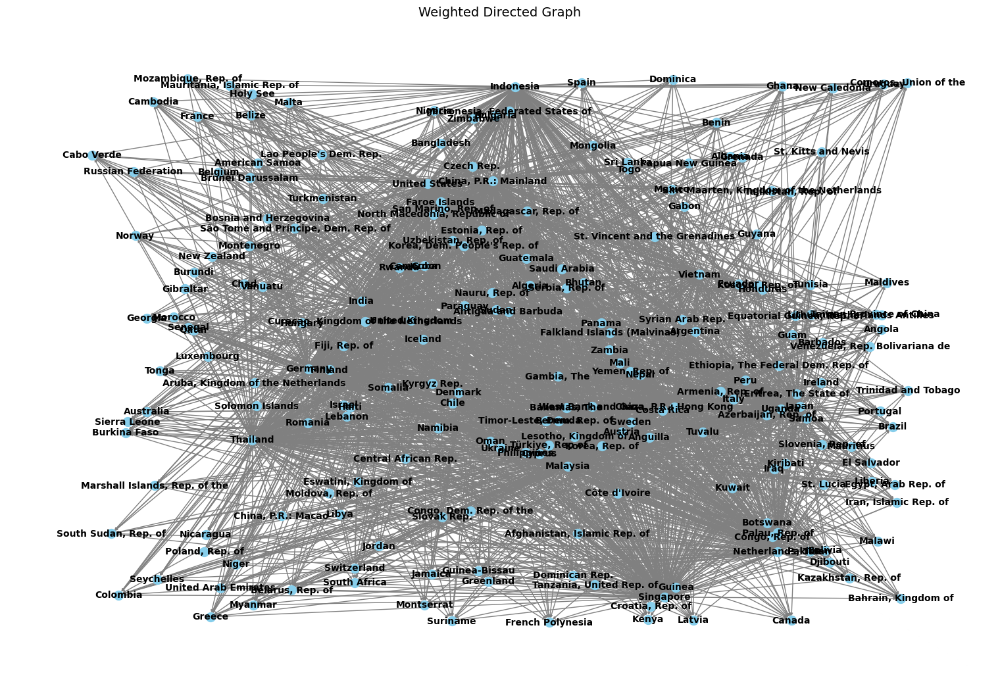

In [24]:
# Draw the weighted directed graph
plt.figure(figsize=(15, 10))
pos = nx.random_layout(weighted_directed_graph)
nx.draw(weighted_directed_graph, pos, with_labels=True, node_size=100, node_color='skyblue', font_size=10, font_weight='bold', arrowsize=5, edge_color='gray', width=1)
# edge_labels = {(source, target): data['2020'] for source, target, data in weighted_directed_graph.edges(data=True)}
# nx.draw_networkx_edge_labels(weighted_directed_graph, pos, edge_labels=edge_labels, font_size=8)
plt.title("Weighted Directed Graph", fontsize=14)
plt.show();

### Scaling Data - Imports

In [25]:
# IMPORTS
# NOTE: IMPORT data is used here. So the size of the nodes reflect the EXPORT of the OTHER COUNTRIES to the major trade partners and PH. 

scaled_vol = np.array(trade_nw_df_impt.iloc[:,2]).reshape(-1,1)
scaler = MinMaxScaler(feature_range=(100, 1000))
scaled_vol = scaler.fit_transform(scaled_vol)
# scaled_vol

scaled_vol = pd.DataFrame(scaled_vol, columns=['2020'])
trade_nw_df_scaled = pd.concat([trade_nw_df_impt[['country','target']],scaled_vol], axis=1, ignore_index=True)
trade_nw_df_scaled.columns = trade_nw_df_impt.columns

# for graphing, add extra step of converting to scalar
trade_nw_df_scaled['2020'] = trade_nw_df_scaled['2020'].round().astype(int)

In [26]:
# imports

trade_nw_df_scaled

,country,target,2020
0,Taiwan Province of China,"China, P.R.: Mainland",518
1,Japan,"China, P.R.: Mainland",464
2,"Korea, Rep. of","China, P.R.: Mainland",459
3,United States,"China, P.R.: Mainland",381
4,Australia,"China, P.R.: Mainland",337
...,...,...,...
2471,Singapore,Philippines,112
2472,Taiwan Province of China,Philippines,110
2473,Thailand,Philippines,110
2474,United States,Philippines,114


In [27]:
in_wgt = trade_nw_df_scaled.groupby('country')['2020'].sum()

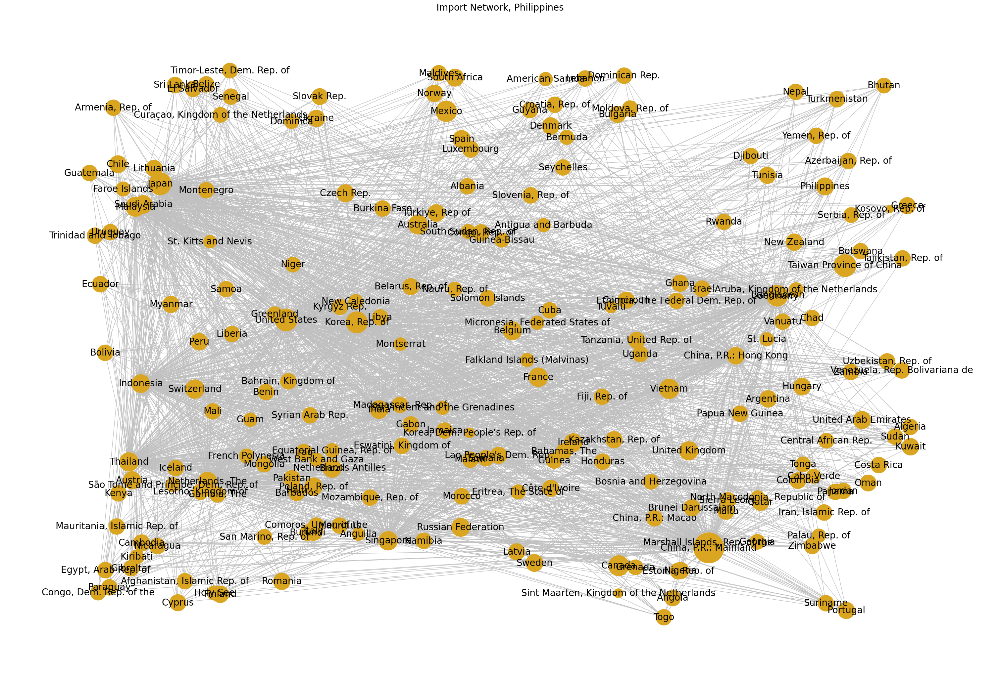

In [28]:
# define new graph network
weighted_dG_imp = nx.from_pandas_edgelist(trade_nw_df_scaled, source='country', target='target', edge_attr='2020', create_using=nx.DiGraph())
# weighted_directed_graph_2

# Get edge weights for setting node sizes
# node_sizes = np.array([data['2020'] for _, _, data in weighted_directed_graph_2.edges(data=True)])#.reshape(-1,1)
node_sizes = in_wgt.to_dict()
# node_sizes

# nx.draw(G, pos, with_labels=True, node_size=[node_sizes[node] for node in G.nodes()], node_color='darkgreen', font_size=10, font_weight='bold', edge_color='gray', width=2)

# print(len(weighted_directed_graph_2.nodes))
# print(weighted_directed_graph_2.nodes)
# print(len(node_sizes))

# # Draw the weighted directed graph with node sizes proportional to edge weights
plt.figure(figsize=(30, 20))
pos = nx.random_layout(weighted_dG_imp, seed=77)
nx.draw(weighted_dG_imp, pos, with_labels=True, node_size=[node_sizes[node] for node in weighted_dG_imp.nodes()], node_color='goldenrod', font_size=20, arrowsize=10, edge_color='silver')
# edge_labels = {(source, target): data['2020'] for source, target, data in weighted_directed_graph.edges(data=True)}
# nx.draw_networkx_edge_labels(weighted_directed_graph, pos, edge_labels=edge_labels, font_size=8)
plt.title("Import Network, Philippines", fontsize=20)
plt.show()

#### Scale for density

In [29]:
# scaled for density

scaled_vol_percentage = np.array(trade_nw_df_impt.iloc[:,2]).reshape(-1,1)
scaler_p = MinMaxScaler()
scaled_vol_percentage = scaler_p.fit_transform(scaled_vol_percentage)
# scaled_vol

scaled_vol_percentage = pd.DataFrame(scaled_vol_percentage, columns=['2020'])
trade_nw_df_scaled_imp_ = pd.concat([trade_nw_df_impt[['country','target']],scaled_vol_percentage], axis=1, ignore_index=True)
trade_nw_df_scaled_imp_.columns = trade_nw_df_impt.columns

# for graphing, add extra step of converting to scalar
# trade_nw_df_scaled_imp_['2020'] = trade_nw_df_scaled_imp_['2020'].round().astype(int)

In [30]:
trade_nw_df_scaled_imp_

,country,target,2020
0,Taiwan Province of China,"China, P.R.: Mainland",0.464015
1,Japan,"China, P.R.: Mainland",0.404385
2,"Korea, Rep. of","China, P.R.: Mainland",0.398443
3,United States,"China, P.R.: Mainland",0.312603
4,Australia,"China, P.R.: Mainland",0.263560
...,...,...,...
2471,Singapore,Philippines,0.013140
2472,Taiwan Province of China,Philippines,0.011160
2473,Thailand,Philippines,0.011163
2474,United States,Philippines,0.015940


In [31]:
weighted_dG_imp__ = nx.from_pandas_edgelist(trade_nw_df_scaled_imp_, source='country', target='target', edge_attr='2020', create_using=nx.DiGraph())
print(nx.density(weighted_dG_imp__))

0.05587903407808621


In [32]:
# manual computation

sum_wgts = sum(trade_nw_df_scaled_imp_['2020'])
sum_wgts / (211 * 210)

0.0004769293098044832

### Scaling Data - Exports

In [33]:
# EXPORTS
# NOTE: EXPORT data is used here. So the size of the nodes reflect the IMPORT of the OTHER COUNTRIES from the major trade partners and PH

scaled_vol = np.array(trade_nw_df_exp.iloc[:,2]).reshape(-1,1)
scaler = MinMaxScaler(feature_range=(100, 1000))
scaled_vol = scaler.fit_transform(scaled_vol)
# scaled_vol

scaled_vol = pd.DataFrame(scaled_vol, columns=['2020'])
trade_nw_df_scaled = pd.concat([trade_nw_df_exp[['source','country']],scaled_vol], axis=1, ignore_index=True)
trade_nw_df_scaled.columns = trade_nw_df_exp.columns

# for graphing, add extra step of converting to scalar
trade_nw_df_scaled['2020'] = trade_nw_df_scaled['2020'].round().astype(int)

In [34]:
trade_nw_df_scaled

,source,country,2020
0,"China, P.R.: Mainland",United States,1000
1,"China, P.R.: Mainland","China, P.R.: Hong Kong",647
2,"China, P.R.: Mainland",Japan,384
3,"China, P.R.: Mainland",Vietnam,327
4,"China, P.R.: Mainland","Korea, Rep. of",325
...,...,...,...
2497,Philippines,Singapore,107
2498,Philippines,Taiwan Province of China,104
2499,Philippines,Thailand,106
2500,Philippines,United States,119


In [35]:
exp_wgt = trade_nw_df_scaled.groupby('country')['2020'].sum()

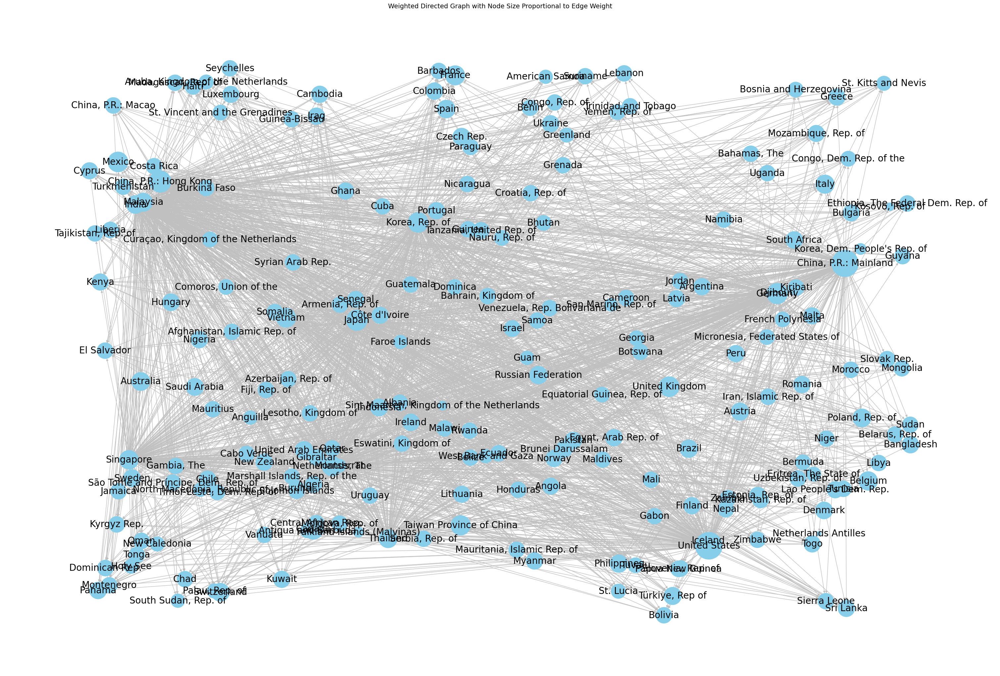

In [36]:
# define new graph network
weighted_dG_exp = nx.from_pandas_edgelist(trade_nw_df_scaled, source='source', target='country', edge_attr='2020', create_using=nx.DiGraph())
# weighted_directed_graph_2

# Get edge weights for setting node sizes
# node_sizes = np.array([data['2020'] for _, _, data in weighted_directed_graph_2.edges(data=True)])#.reshape(-1,1)
node_sizes = exp_wgt.to_dict()
# node_sizes

# nx.draw(G, pos, with_labels=True, node_size=[node_sizes[node] for node in G.nodes()], node_color='darkgreen', font_size=10, font_weight='bold', edge_color='gray', width=2)

# print(len(weighted_directed_graph_2.nodes))
# print(weighted_directed_graph_2.nodes)
# print(len(node_sizes))

# # Draw the weighted directed graph with node sizes proportional to edge weights
plt.figure(figsize=(30, 20))
pos = nx.random_layout(weighted_dG_exp, seed=77)
nx.draw(weighted_dG_exp, pos, with_labels=True, node_size=[node_sizes[node] for node in weighted_dG_exp.nodes()], node_color='skyblue', font_size=20, arrowsize=10, edge_color='silver')
# edge_labels = {(source, target): data['2020'] for source, target, data in weighted_directed_graph.edges(data=True)}
# nx.draw_networkx_edge_labels(weighted_directed_graph, pos, edge_labels=edge_labels, font_size=8)
plt.title("Weighted Directed Graph with Node Size Proportional to Edge Weight", fontsize=14)
plt.show()

### Network Properties

In [37]:
print("Number of nodes:", weighted_dG_imp.number_of_nodes())
print("Number of edges:", weighted_dG_imp.number_of_edges())
# print("Nodes:", weighted_directed_graph_imp.nodes())
# print("Edges:", weighted_directed_graph_imp.edges())

print("Number of nodes:", weighted_dG_exp.number_of_nodes())
print("Number of edges:", weighted_dG_exp.number_of_edges())

Number of nodes: 211
Number of edges: 2476
Number of nodes: 211
Number of edges: 2502


In [38]:
graph_density_imp = nx.density(weighted_dG_imp)
graph_density_exp = nx.density(weighted_dG_exp)

print("Network Density (Directed Graph):", graph_density_imp)
print("Network Density (Directed Graph):", graph_density_exp)

Network Density (Directed Graph): 0.05587903407808621
Network Density (Directed Graph): 0.05646580907244415


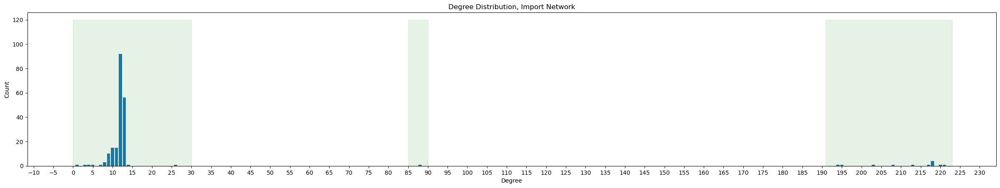

In [83]:
# Calculate the degree of each node
degrees = dict(weighted_dG_imp.degree())

# Plot the degree distribution
degree_values = list(degrees.values())

# fig, ax = plt.subplots(1,1, sharey=True, figsize=(50,7))
plt.figure().set_figwidth(30)
ax = plt.gca()
ax.xaxis.set_major_locator(ticker.MultipleLocator(base=5))
plt.hist(degree_values, bins=range(max(degree_values) + 2), align='left', rwidth=0.8)
ax.fill_betweenx([0,120], 0, 30, color='green', alpha=0.1)
ax.fill_betweenx([0,120], 85, 90, color='green', alpha=0.1)
ax.fill_betweenx([0,120], 191, 223, color='green', alpha=0.1)
plt.xlabel('Degree')
plt.ylabel('Count')
plt.title('Degree Distribution, Import Network')
# plt.xticks(range(max(degree_values) + 1))
plt.show()

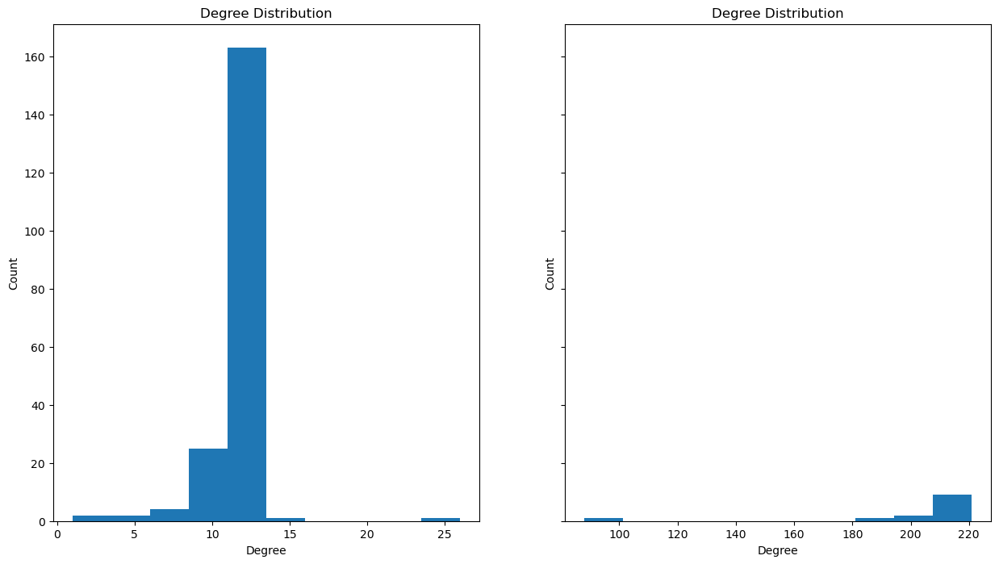

In [40]:
# degree_sequence = [d for n, d in G.degree()]

# Calculate the degree of each node
degrees = dict(weighted_dG_imp.degree())

# Plot the degree distribution
degree_values = list(degrees.values())

trim_deg1 = [_ for _ in degree_values if _ < 27]
trim_deg2 = [_ for _ in degree_values if _ > 27]

fig, ax = plt.subplots(1,2, sharey=True, figsize=(15,8))
ax[0].hist(trim_deg1, align='mid')
ax[1].hist(trim_deg2, align='mid')
ax[0].set_xlabel('Degree')
ax[0].set_ylabel('Count')
ax[0].set_title('Degree Distribution')
ax[1].set_xlabel('Degree')
ax[1].set_ylabel('Count')
ax[1].set_title('Degree Distribution')
# plt.xticks(range(max(degree_values) + 1))
plt.show()

In [75]:
# in degree count

degr_imp = dict(weighted_dG_imp.degree())

# Plot the degree distribution
degr_imp_values = list(degr_imp.values())
print(f"max: {max(degr_imp_values)}")
print(f"max: {min(degr_imp_values)}")

# degrees = dict(G.degree())
num_nodes = weighted_dG_imp.number_of_nodes()
average_degree = sum(degr_imp.values()) / num_nodes
print(f"ave: {average_degree}")

max: 221
max: 1
ave: 23.46919431279621


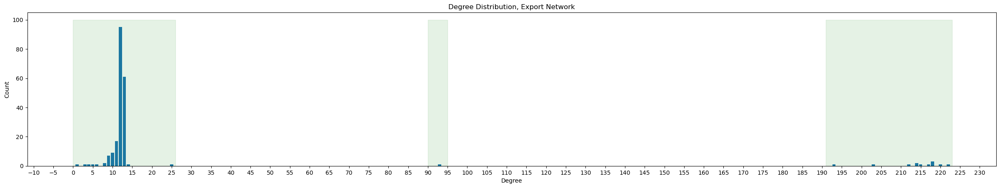

In [71]:
# Calculate the degree of each node
degrees = dict(weighted_dG_exp.degree())

# Plot the degree distribution
degree_values = list(degrees.values())

# fig, ax = plt.subplots(1,1, sharey=True, figsize=(50,7))
plt.figure().set_figwidth(30)
ax = plt.gca()
ax.xaxis.set_major_locator(ticker.MultipleLocator(base=5))
plt.hist(degree_values, bins=range(max(degree_values) + 2), align='left', rwidth=0.8)
ax.fill_betweenx([0,100], 0, 26, color='green', alpha=0.1)
ax.fill_betweenx([0,100], 90, 95, color='green', alpha=0.1)
ax.fill_betweenx([0,100], 191, 223, color='green', alpha=0.1)
plt.xlabel('Degree')
plt.ylabel('Count')
plt.title('Degree Distribution, Export Network')
# plt.xticks(range(max(degree_values) + 1))
plt.show()

In [76]:
# in degree count

degr_exp = dict(weighted_dG_exp.degree())

# Plot the degree distribution
degr_exp_values = list(degr_exp.values())
print(f"max: {max(degr_exp_values)}")
print(f"max: {min(degr_exp_values)}")

num_nodes = weighted_dG_exp.number_of_nodes()
average_degree = sum(degr_exp.values()) / num_nodes
print(f"ave: {average_degree}")

max: 222
max: 1
ave: 23.71563981042654


In [131]:
diameter = nx.diameter(weighted_dG_imp)
print("Network diameter:", diameter)

diameter = nx.diameter(weighted_dG_exp)
print("Network diameter:", diameter)

NetworkXError: Found infinite path length because the digraph is not strongly connected

In [132]:
average_shortest_path_length = nx.average_shortest_path_length(weighted_directed_graph_imp)
print("Average shortest path length:", average_shortest_path_length)

NetworkXError: Graph is not strongly connected.

In [133]:
# largest connected component
components = nx.connected_components(weighted_directed_graph_imp)
largest_component = max(components, key=len)
H = weighted_directed_graph_imp.subgraph(largest_component)

NetworkXNotImplemented: not implemented for directed type

In [44]:
cc_imp = nx.average_clustering(weighted_dG_imp)
print("Clustering coefficient Import Graph:", cc_imp)

cc_exp = nx.average_clustering(weighted_dG_exp)
print("Clustering coefficient Export Graph:", cc_exp)

Clustering coefficient Import Graph: 0.9406912959922282
Clustering coefficient Export Graph: 0.9405792038261765


#### Centrality - Degree

In [45]:
deg_cen_imp_in = nx.in_degree_centrality(weighted_dG_imp)
deg_cen_imp_out = nx.out_degree_centrality(weighted_dG_imp)
print("In-Degree Centrality:", deg_cen_imp_in)
print("Out-Degree Centrality:", deg_cen_imp_out)

# deg_cen_exp = nx.in_degree_centrality(weighted_dG_exp)
# print("Degree centrality:", deg_cen_exp)

In-Degree Centrality: {'Taiwan Province of China': 0.0, 'China, P.R.: Mainland': 0.9761904761904763, 'Japan': 0.9523809523809524, 'Korea, Rep. of': 0.9761904761904763, 'United States': 0.9761904761904763, 'Australia': 0.0, 'Germany': 0.9857142857142858, 'Brazil': 0.0, 'Vietnam': 0.35714285714285715, 'Malaysia': 0.9047619047619049, 'Russian Federation': 0.0, 'Thailand': 0.861904761904762, 'Saudi Arabia': 0.0, 'Indonesia': 0.9714285714285715, 'Singapore': 0.9761904761904763, 'France': 0.0, 'Chile': 0.0, 'Italy': 0.0, 'Canada': 0.0, 'India': 0.9285714285714286, 'South Africa': 0.0, 'United Kingdom': 0.0, 'Philippines': 0.06190476190476191, 'Iraq': 0.0, 'Switzerland': 0.0, 'United Arab Emirates': 0.0, 'Mexico': 0.0, 'Oman': 0.0, 'Angola': 0.0, 'Peru': 0.0, 'Ireland': 0.0, 'Netherlands, The': 0.9952380952380954, 'New Zealand': 0.0, 'Kuwait': 0.0, 'Spain': 0.0, 'Kazakhstan, Rep. of': 0.0, 'Sweden': 0.0, 'Qatar': 0.0, 'Belgium': 0.0, 'Ukraine': 0.0, 'Norway': 0.0, 'China, P.R.: Hong Kong': 0.

In [46]:
# Sort the dictionary based on its values in ascending order
deg_cen_imp_in_ = {k: v for k, v in sorted(deg_cen_imp_in.items(), key=lambda item: item[1], reverse=True)}
deg_cen_imp_in_ = {key: value*100 for key, value in deg_cen_imp_in_.items() if value > 0}
# deg_cen_imp_in_ = {key: value for key, value in deg_cen_imp_in_.items() if value != 0}
print(deg_cen_imp_in_)

{'Netherlands, The': 99.52380952380953, 'Germany': 98.57142857142858, 'China, P.R.: Mainland': 97.61904761904762, 'Korea, Rep. of': 97.61904761904762, 'United States': 97.61904761904762, 'Singapore': 97.61904761904762, 'Indonesia': 97.14285714285715, 'Japan': 95.23809523809524, 'India': 92.85714285714286, 'Malaysia': 90.47619047619048, 'China, P.R.: Hong Kong': 86.66666666666667, 'Thailand': 86.19047619047619, 'Vietnam': 35.714285714285715, 'Philippines': 6.190476190476191}


In [47]:
deg_cen_imp_out = {k: v for k, v in sorted(deg_cen_imp_out.items(), key=lambda item: item[1], reverse=True)}
deg_cen_imp_out = {key: value*100 for key, value in deg_cen_imp_out.items() if value > 0.5}
print(deg_cen_imp_out)

{}


In [48]:
pd.DataFrame(
    [deg_cen_imp_in_],
    index=['Normalized In-Degree Centrality, Imports (%)']).T

,"Normalized In-Degree Centrality, Imports (%)"
"Netherlands, The",99.523810
Germany,98.571429
"China, P.R.: Mainland",97.619048
"Korea, Rep. of",97.619048
United States,97.619048
Singapore,97.619048
Indonesia,97.142857
Japan,95.238095
India,92.857143
Malaysia,90.476190


In [49]:
deg_cen_exp_in = nx.in_degree_centrality(weighted_dG_exp)
deg_cen_exp_out = nx.out_degree_centrality(weighted_dG_exp)
print("In-Degree Centrality:", deg_cen_exp_in)
print("Out-Degree Centrality:", deg_cen_exp_out)

In-Degree Centrality: {'China, P.R.: Mainland': 0.06190476190476191, 'United States': 0.06190476190476191, 'China, P.R.: Hong Kong': 0.06190476190476191, 'Japan': 0.06190476190476191, 'Vietnam': 0.06190476190476191, 'Korea, Rep. of': 0.06190476190476191, 'Germany': 0.06190476190476191, 'Netherlands, The': 0.06190476190476191, 'United Kingdom': 0.06190476190476191, 'India': 0.05714285714285715, 'Taiwan Province of China': 0.06666666666666668, 'Singapore': 0.06190476190476191, 'Malaysia': 0.06190476190476191, 'Australia': 0.06190476190476191, 'Thailand': 0.06190476190476191, 'Russian Federation': 0.06190476190476191, 'Mexico': 0.06190476190476191, 'Canada': 0.06190476190476191, 'Philippines': 0.06190476190476191, 'Indonesia': 0.05714285714285715, 'France': 0.06190476190476191, 'Brazil': 0.06190476190476191, 'Italy': 0.06190476190476191, 'United Arab Emirates': 0.06190476190476191, 'Saudi Arabia': 0.06190476190476191, 'Poland, Rep. of': 0.06190476190476191, 'Spain': 0.06190476190476191, '

In [50]:
deg_cen_exp_in_ = {k: v for k, v in sorted(deg_cen_exp_in.items(), key=lambda item: item[1], reverse=True)}
deg_cen_exp_in_ = {key: value*100 for key, value in deg_cen_exp_in_.items() if value != 0}
print(deg_cen_exp_in_)

{'Taiwan Province of China': 6.666666666666668, 'China, P.R.: Mainland': 6.190476190476191, 'United States': 6.190476190476191, 'China, P.R.: Hong Kong': 6.190476190476191, 'Japan': 6.190476190476191, 'Vietnam': 6.190476190476191, 'Korea, Rep. of': 6.190476190476191, 'Germany': 6.190476190476191, 'Netherlands, The': 6.190476190476191, 'United Kingdom': 6.190476190476191, 'Singapore': 6.190476190476191, 'Malaysia': 6.190476190476191, 'Australia': 6.190476190476191, 'Thailand': 6.190476190476191, 'Russian Federation': 6.190476190476191, 'Mexico': 6.190476190476191, 'Canada': 6.190476190476191, 'Philippines': 6.190476190476191, 'France': 6.190476190476191, 'Brazil': 6.190476190476191, 'Italy': 6.190476190476191, 'United Arab Emirates': 6.190476190476191, 'Saudi Arabia': 6.190476190476191, 'Poland, Rep. of': 6.190476190476191, 'Spain': 6.190476190476191, 'Belgium': 6.190476190476191, 'Türkiye, Rep of': 6.190476190476191, 'Nigeria': 6.190476190476191, 'Pakistan': 6.190476190476191, 'Chile':

In [51]:
deg_cen_exp_out_ = {k: v for k, v in sorted(deg_cen_exp_out.items(), key=lambda item: item[1], reverse=True)}
deg_cen_exp_out_ = {key: value*100 for key, value in deg_cen_exp_out_.items() if value > 0}
print(deg_cen_exp_out_)

{'Netherlands, The': 99.52380952380953, 'Germany': 98.57142857142858, 'India': 98.0952380952381, 'China, P.R.: Mainland': 97.61904761904762, 'United States': 97.61904761904762, 'Korea, Rep. of': 97.14285714285715, 'Japan': 96.1904761904762, 'Indonesia': 96.1904761904762, 'Singapore': 95.71428571428572, 'Malaysia': 94.76190476190477, 'China, P.R.: Hong Kong': 90.47619047619048, 'Thailand': 85.71428571428572, 'Vietnam': 38.0952380952381, 'Philippines': 5.714285714285714}


In [52]:
# pd.DataFrame([deg_cen_imp_in,deg_cen_imp_out], index=['Normalized In-Degree Centrality (%)','Normalized Out-Degree Centrality (%)']).T
pd.DataFrame(
    [deg_cen_exp_out_],
    index=['Normalized Out-Degree Centrality, Exports (%)']
    ).T

,"Normalized Out-Degree Centrality, Exports (%)"
"Netherlands, The",99.523810
Germany,98.571429
India,98.095238
"China, P.R.: Mainland",97.619048
United States,97.619048
"Korea, Rep. of",97.142857
Japan,96.190476
Indonesia,96.190476
Singapore,95.714286
Malaysia,94.761905


In [54]:
betweenness_centrality = nx.betweenness_centrality(weighted_dG_imp)
print("Betweenness centrality:", betweenness_centrality)

betweenness_centrality = nx.betweenness_centrality(weighted_dG_exp)
print("Betweenness centrality:", betweenness_centrality)

Betweenness centrality: {'Taiwan Province of China': 0.0, 'China, P.R.: Mainland': 0.001256623619918221, 'Japan': 0.0008619196554945024, 'Korea, Rep. of': 0.000902862232322247, 'United States': 0.0010296656964462853, 'Australia': 0.0, 'Germany': 0.0010526685663391072, 'Brazil': 0.0, 'Vietnam': 0.00013052603961694867, 'Malaysia': 0.0007244810833327587, 'Russian Federation': 0.0, 'Thailand': 0.0006912713372043519, 'Saudi Arabia': 0.0, 'Indonesia': 0.000908711993811106, 'Singapore': 0.000902862232322247, 'France': 0.0, 'Chile': 0.0, 'Italy': 0.0, 'Canada': 0.0, 'India': 0.0008074922975811571, 'South Africa': 0.0, 'United Kingdom': 0.0, 'Philippines': 0.0, 'Iraq': 0.0, 'Switzerland': 0.0, 'United Arab Emirates': 0.0, 'Mexico': 0.0, 'Oman': 0.0, 'Angola': 0.0, 'Peru': 0.0, 'Ireland': 0.0, 'Netherlands, The': 0.0006665267721316937, 'New Zealand': 0.0, 'Kuwait': 0.0, 'Spain': 0.0, 'Kazakhstan, Rep. of': 0.0, 'Sweden': 0.0, 'Qatar': 0.0, 'Belgium': 0.0, 'Ukraine': 0.0, 'Norway': 0.0, 'China, P

In [56]:
# hubs = [node for node, centrality in degree_centralities.items() if centrality > threshold]
# sum([centrality for node, centrality in deg_cen_imp.items()])

#### Centrality - Betweenness

In [59]:
betw_cen_imp = nx.betweenness_centrality(weighted_dG_imp,
                                          weight='2020')

# deg_cen_imp_out = nx.out_degree_centrality(weighted_dG_imp)
# print("In-Degree Centrality:", deg_cen_imp_in)
# print("Out-Degree Centrality:", deg_cen_imp_out)

# deg_cen_exp = nx.in_degree_centrality(weighted_dG_exp)
# print("Degree centrality:", deg_cen_exp)

In [60]:
# get nonzero measures

betw_cen_imp_ = {k: v for k, v in sorted(betw_cen_imp.items(), key=lambda item: item[1], reverse=True)}
betw_cen_imp_ = {key: value*100 for key, value in betw_cen_imp_.items() if value > 0}
print(betw_cen_imp_)

{'Netherlands, The': 0.5228981544771019, 'India': 0.33245993772309557, 'China, P.R.: Hong Kong': 0.10119996962102226, 'Germany': 0.08107389686337056, 'Philippines': 0.05012531328320802, 'China, P.R.: Mainland': 0.02961950330371383, 'Vietnam': 0.021834890255942884, 'Indonesia': 0.013670539986329458}


Text(0.5, 1.0, 'Betweenness Scores, Import Network')

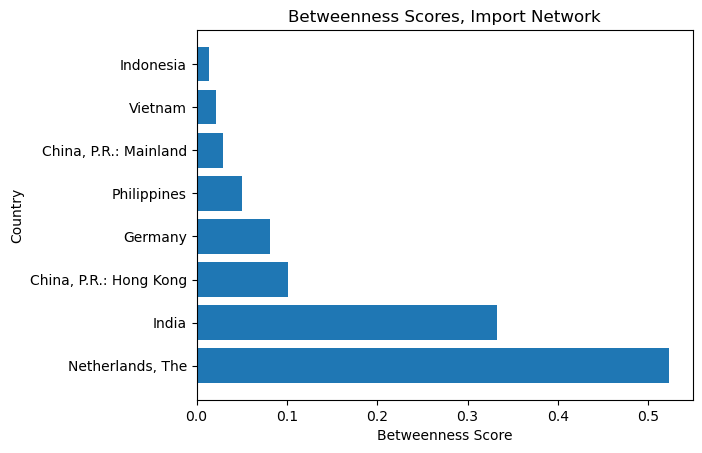

In [79]:
# Extract keys and values from the dictionary
keys = list(betw_cen_imp_.keys())
values = list(betw_cen_imp_.values())

# Create the horizontal bar graph
plt.barh(keys, values)

# Set labels and title
plt.xlabel('Betweenness Score')
plt.ylabel('Country')
plt.title('Betweenness Scores, Import Network')

In [57]:
betw_cen_exp = nx.betweenness_centrality(weighted_dG_exp,
                                          weight='2020')

In [58]:
# get nonzero measures

betw_cen_exp_ = {k: v for k, v in sorted(betw_cen_exp.items(), key=lambda item: item[1], reverse=True)}
betw_cen_exp_ = {key: value*100 for key, value in betw_cen_exp_.items() if value > 0}
print(betw_cen_exp_)

{'Indonesia': 0.22784233310549099, 'Netherlands, The': 0.2050580997949419, 'Malaysia': 0.1993620414673046, 'Singapore': 0.1367053998632946, 'Vietnam': 0.10290878711931345, 'Germany': 0.06037821827295512, 'Philippines': 0.0455684666210982, 'Korea, Rep. of': 0.03607503607503607, 'China, P.R.: Mainland': 0.02961950330371383, 'India': 0.014809751651856915, 'China, P.R.: Hong Kong': 0.006835269993164729, 'Japan': 0.00227842333105491, 'Thailand': 0.001139211665527455}


Text(0.5, 1.0, 'Betweenness Scores, Export Network')

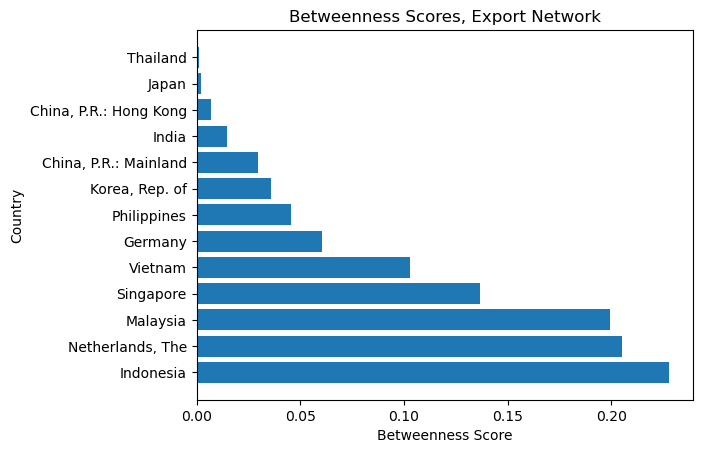

In [81]:
# Extract keys and values from the dictionary
keys = list(betw_cen_exp_.keys())
values = list(betw_cen_exp_.values())

# Create the horizontal bar graph
plt.barh(keys, values)

# Set labels and title
plt.xlabel('Betweenness Score')
plt.ylabel('Country')
plt.title('Betweenness Scores, Export Network')

In [76]:
df_export_final = pd.read_excel('export_dat.xlsx')
# df_export_final.fillna(0)
df_export_final = (df_export_final
                   .fillna(0)
                   .iloc[:,1:])

In [98]:
df_export_final#[df_export_final[2021] ]

,country,2002,2003,2004,2005,2006,2007,2008,2009,2010,...,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
0,"Afghanistan, Islamic Rep. of",0.000005,0.000033,1.568256e-07,1.398527e-07,0.000000,0.000000e+00,0.000000,6.890329e-06,4.266421e-05,...,0.000017,0.000006,0.000019,0.000009,7.904673e-07,0.000002,1.288889e-06,0.000021,0.000003,7.748541e-06
1,Albania,0.000322,0.000350,2.101191e-04,9.152692e-05,0.000106,2.517682e-04,0.000175,2.207814e-04,1.827298e-04,...,0.000265,0.000355,0.000328,0.000518,2.083607e-04,0.000270,2.932837e-04,0.000227,0.000098,1.436555e-04
2,Algeria,0.000028,0.000109,1.455960e-04,1.326415e-04,0.000007,1.100712e-04,0.000176,1.560454e-04,1.733990e-04,...,0.000068,0.000077,0.000052,0.000216,2.201881e-04,0.000008,1.118797e-04,0.000117,0.000108,7.606180e-05
3,American Samoa,0.000040,0.000055,4.361406e-05,7.031952e-05,0.000025,1.158775e-04,0.000198,5.083355e-04,5.158200e-05,...,0.000060,0.000059,0.000058,0.000031,3.097487e-05,0.000032,3.415831e-05,0.000034,0.000036,3.506280e-05
4,Angola,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,...,0.000000,0.000000,0.000000,0.000000,1.763904e-06,0.000006,4.211129e-07,0.000000,0.000000,0.000000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
182,"Venezuela, Rep. Bolivariana de",0.011847,0.019949,8.532919e-02,4.192920e-02,0.041157,5.070899e-02,0.046841,5.107808e-02,7.289044e-02,...,0.060057,0.045865,0.026923,0.058721,6.394637e-02,0.084770,8.931195e-02,0.109698,0.127574,1.381839e-01
183,Vietnam,0.000095,0.000230,4.774375e-05,1.027290e-04,0.000084,2.970909e-04,0.000116,9.973758e-04,3.855670e-04,...,0.000642,0.000697,0.000311,0.000232,1.894373e-04,0.000072,1.696564e-04,0.000438,0.000431,3.849505e-04
184,"Yemen, Rep. of",0.000024,0.000012,2.346121e-07,0.000000e+00,0.000003,0.000000e+00,0.000014,8.597387e-07,9.717026e-07,...,0.000009,0.000016,0.000008,0.000001,4.899569e-05,0.000012,1.122800e-05,0.000026,0.000030,7.650559e-07
185,Zambia,0.000011,0.000009,4.037007e-06,1.071455e-05,0.000006,1.056805e-07,0.000000,3.231941e-05,1.580122e-05,...,0.000215,0.000032,0.000007,0.000028,2.116479e-05,0.000087,5.694581e-06,0.000017,0.000026,2.169443e-06


(array([159.,   7.,   4.,   1.,   3.,   1.,   1.,   0.,   0.,   0.,   0.,
          0.,   0.,   1.,   0.,   1.,   0.,   0.,   0.,   0.,   0.,   2.,
          0.,   0.,   1.,   0.,   0.,   0.,   0.,   1.,   0.,   0.,   0.,
          0.,   0.,   1.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   1.,   0.,   0.,   0.,   0.,
          0.,   0.,   1.,   0.,   0.,   0.,   0.,   0.,   0.,   1.,   0.,
          1.]),
 array([0.  , 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 ,
        0.11, 0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 , 0.21,
        0.22, 0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3 , 0.31, 0.32,
        0.33, 0.34, 0.35, 0.36, 0.37, 0.38, 0.39, 0.4 , 0.41, 0.42, 0.43,
        0.44, 0.45, 0.

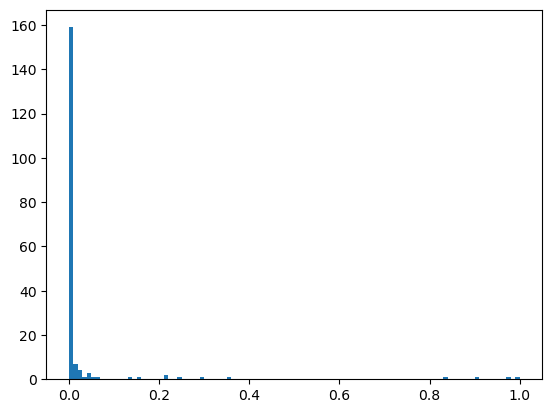

In [86]:
plt.hist(df_export_final[2021], bins=100 )

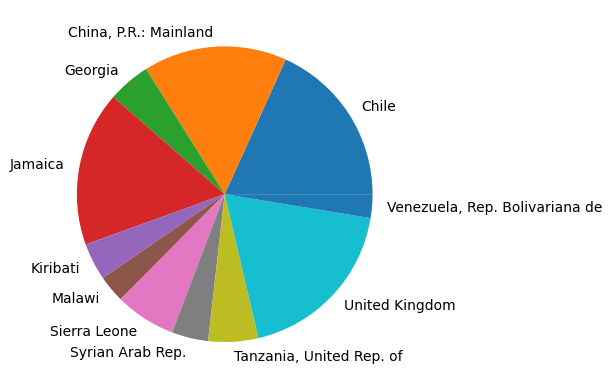

In [90]:
# import matplotlib.pyplot as plt



labels = df_export_final[df_export_final[2021] > 0.1]['country']
sizes = df_export_final[df_export_final[2021] > 0.1][2021]

fig, ax = plt.subplots()
ax.pie(sizes, labels=labels)
plt.show();